<a href="https://colab.research.google.com/github/shreyesss/CRACK_DETECTION-CVI2021/blob/pix2pix/pix2pix%2Btransformer_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup



In [95]:
pip install tensorflow_addons

In [96]:
import tensorflow as tf
import tensorflow_addons as tfa

import os
import time

from matplotlib import pyplot as plt
from IPython import display

import numpy as np
import random

import glob

tf.random.set_seed(42)
random.seed(42)

In [97]:
!pip install -U tensorboard

In [98]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [99]:
BUFFER_SIZE = 400
BATCH_SIZE = 32
IMG_WIDTH = 256
IMG_HEIGHT = 256

# Data Loading

In [100]:
def crop(input_image, real_image, feature):
    scale = IMG_HEIGHT/448
    cropped_input = tf.image.central_crop(input_image, central_fraction = 256/448 )
    cropped_real = tf.image.central_crop(real_image, central_fraction = 256/448 )
    cropped_feature = tf.image.central_crop(feature, central_fraction = 256/448 )

    cropped_input = tf.image.resize(cropped_input, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    cropped_real = tf.image.resize(cropped_real, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    cropped_feature = tf.image.resize(cropped_feature, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    return cropped_input, cropped_real, cropped_feature

In [101]:
# normalizing the images to [0, 1]

def normalize(input_image, real_image, feature):
    input_image = (input_image / 255)
    real_image = (real_image / 255)
    feature = (feature/255)

    input_image = tf.clip_by_value(input_image, 0, 1)
    real_image = tf.clip_by_value(real_image, 0, 1)
    feature = tf.clip_by_value(feature, 0, 1)

    return input_image, real_image, feature

In [102]:
def flipleftright(input_image,real_image,feature):
  if tf.random.uniform(()) > 0.5:
     #random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
        feature = tf.image.flip_left_right(feature)
  return input_image, real_image, feature

In [103]:
def flipupdown(input_image,real_image, feature):
  if tf.random.uniform(()) > 0.5:
      input_image = tf.image.flip_up_down(input_image)
      real_image = tf.image.flip_up_down(real_image)
      feature = tf.image.flip_up_down(feature)
  return input_image, real_image, feature

In [104]:
def randomrotate(input_image,real_image, feature):
  p = tf.random.uniform(())
  if p <= 0.25:
    input_image = tfa.image.rotate(input_image, np.pi/2)
    real_image = tfa.image.rotate(real_image, np.pi/2)
    feature = tfa.image.rotate(feature, np.pi/2)
  elif p<=0.5:
    input_image = tfa.image.rotate(input_image, np.pi)
    real_image = tfa.image.rotate(real_image, np.pi)
    feature = tfa.image.rotate(feature, np.pi)
  elif p<=0.75:
    input_image = tfa.image.rotate(input_image, 1.5*np.pi)
    real_image = tfa.image.rotate(real_image, 1.5*np.pi)
    feature = tfa.image.rotate(feature, 1.5*np.pi)
  
  return input_image, real_image, feature

In [105]:
def multiply(input_image,real_image, feature):
  alpha = random.uniform(0.8, 1.5)
  input_image = alpha*input_image
  
  return input_image, real_image, feature

In [106]:
def gaussianblur(input_image,real_image, feature):
  sig = random.uniform(0, 5)
  input_image = tfa.image.gaussian_filter2d(input_image, filter_shape =  (3, 3), sigma = sig)

  return input_image, real_image, feature

In [107]:
def roundoff(input_image, real_image, feature):
  
  real_image = tf.round(real_image)

  return input_image, real_image, feature

In [108]:
@tf.function()
def operations(input_image, real_image, feature):

  # cropping to 256 x 256 x 3
    input_image, real_image, feature = crop(input_image, real_image, feature)

    funcs = [flipleftright,flipupdown,randomrotate,multiply,gaussianblur]
    random.shuffle(funcs)

    for function in funcs:
      input_image, real_image, feature = function(input_image, real_image, feature)

    return input_image, real_image, feature

In [109]:
train_images = r'/content/gdrive/MyDrive/CrackGAN/dj_train/'
test_images = r'/content/gdrive/MyDrive/CrackGAN/dj_test/'

train = glob.glob(os.path.join(train_images,"*.jpg"))
test = glob.glob(os.path.join(test_images,"*.jpg"))

features_dir = r'/content/gdrive/MyDrive/CrackGAN/heads/atten_2/'
feature_string = "heads/atten_2"

In [110]:
def train_parse_image(img_path: str):
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image, channels=3)
    #image = tf.image.convert_image_dtype(image, tf.float32)
    w = tf.shape(image)[1]
    a = w // 2
    rgb_image = image[:, :a, :]
    mask = image[:, a:, :]

    rgb_image = tf.cast(rgb_image, tf.float32)
    mask = tf.cast(mask, tf.float32)

    feature_path = tf.strings.regex_replace(img_path, "dj_train", feature_string)
    feature = tf.io.read_file(feature_path)
    feature = tf.image.decode_jpeg(feature, channels=3)
    feature = tf.image.convert_image_dtype(feature, tf.float32)

    mask = tf.image.rgb_to_grayscale(mask)
    feature = tf.image.rgb_to_grayscale(feature)

    return rgb_image, mask, feature

def test_parse_image(img_path: str):
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image, channels=3)
    #image = tf.image.convert_image_dtype(image, tf.float32)
    w = tf.shape(image)[1]
    a = w // 2
    rgb_image = image[:, :a, :]
    mask = image[:, a:, :]

    rgb_image = tf.cast(rgb_image, tf.float32)
    mask = tf.cast(mask, tf.float32)

    feature_path = tf.strings.regex_replace(img_path, "dj_test", feature_string)
    feature = tf.io.read_file(feature_path)
    feature = tf.image.decode_jpeg(feature, channels=3)
    #feature = tf.image.convert_image_dtype(feature, tf.float32)

    mask = tf.image.rgb_to_grayscale(mask)
    feature = tf.image.rgb_to_grayscale(feature)

    return rgb_image, mask, feature

In [111]:
def load_image_train(input_image, real_image, feature):
    #input_image, real_image, feature = load(image_file)

    
    input_image, real_image, feature = operations(input_image, real_image, feature)
    input_image, real_image, feature = normalize(input_image, real_image, feature)
    input_image, real_image, feature = roundoff(input_image, real_image, feature)
    

    return input_image, real_image, feature

In [112]:
def load_image_test(input_image, real_image, feature):
    
    input_image, real_image, feature = crop(input_image, real_image, feature)
    input_image, real_image, feature = normalize(input_image, real_image, feature)
    input_image, real_image, feature = roundoff(input_image, real_image, feature)

    return input_image, real_image, feature

In [113]:
train_dataset =  tf.data.Dataset.from_tensor_slices(train)
train_dataset = train_dataset.map(train_parse_image)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.from_tensor_slices(test)
test_dataset = test_dataset.map(test_parse_image)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE)


In [114]:
test_dataset

<BatchDataset shapes: ((None, 256, 256, 3), (None, 256, 256, 1), (None, 256, 256, 1)), types: (tf.float32, tf.float32, tf.float32)>

# Building the Generator

In [115]:
OUTPUT_CHANNELS = 1

In [116]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

In [117]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

In [118]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    features = tf.keras.layers.Input(shape=[256, 256, 1])
    x = tf.keras.layers.concatenate([inputs, features])  # (bs, 256, 256, (3 + 1))

    down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    downsample(512, 4),  # (bs, 1, 1, 512)
    ]

    up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

    #x = inputs

  # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=[inputs,features], outputs=x)

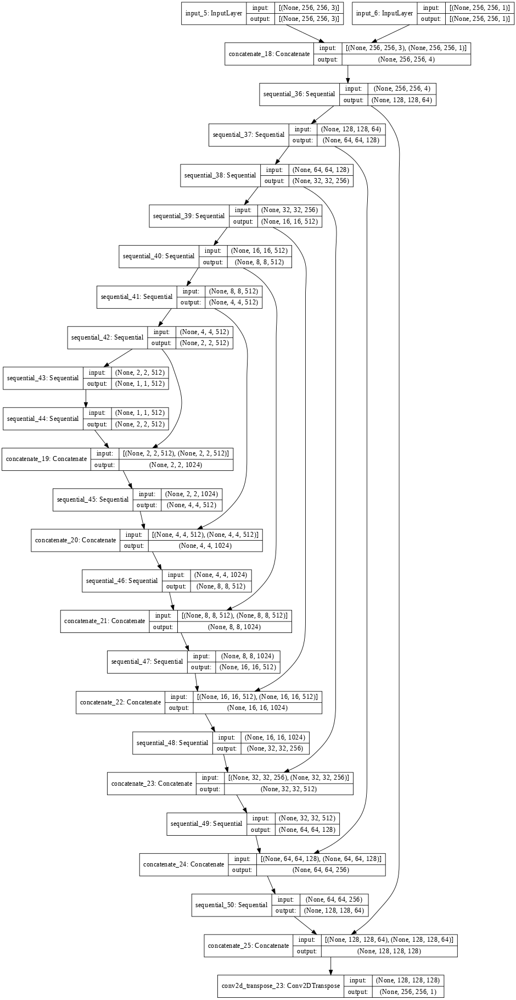

In [119]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [120]:
LAMBDA = 100

In [121]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [122]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

# Building the Discriminator

In [123]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image')
    feature = tf.keras.layers.Input(shape=[256, 256, 1], name='feature')

    x = tf.keras.layers.concatenate([inp, tar, feature])  # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar, feature], outputs=last)

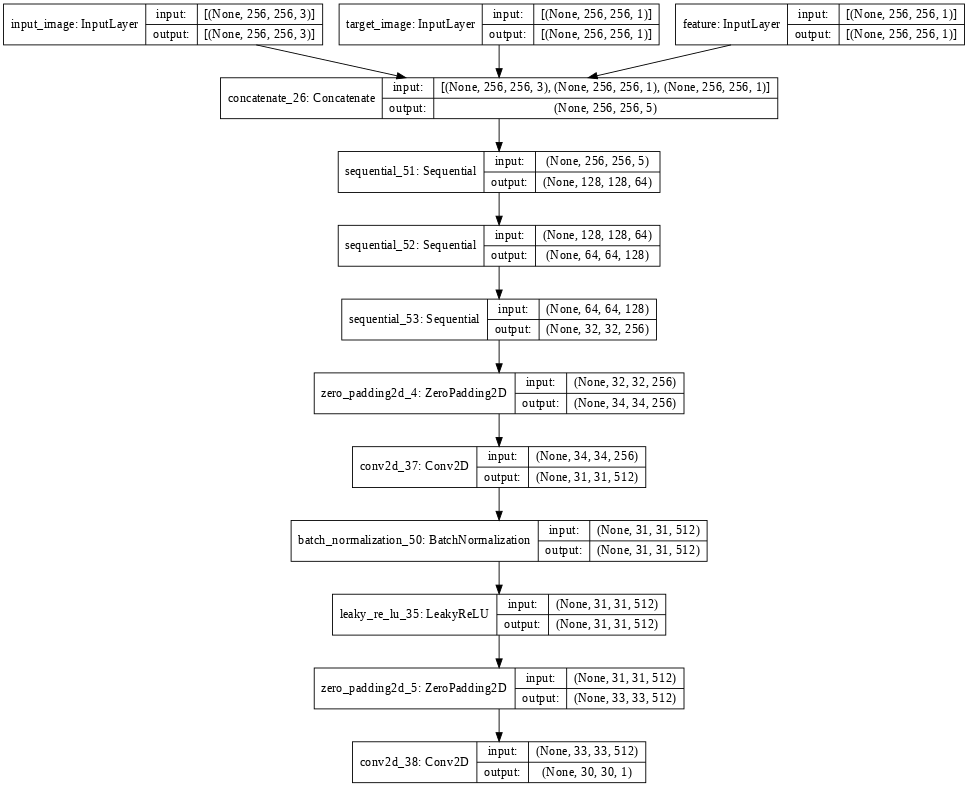

In [124]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [125]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

# Optimizers and Checkpoints

In [126]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [127]:
checkpoint_dir = './gdrive/MyDrive/CrackGAN/Checkpoints-Features-Atten2'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# Testing Generator

In [128]:
def generate_images(model, test_input, tar, feature):
    prediction = model([test_input, feature], training=True)
    plt.figure(figsize=(15, 15))
    plot_tar = np.reshape(tar[0],(256,256))
    #print(plot_tar)
    plot_pred = np.reshape(prediction[0],(256,256)).copy()
    plot_feat = np.reshape(feature[0],(256,256)).copy()


    for i in range(0,256):
      for j in range(0,256):
        if plot_pred[i][j]>=0.5:
          plot_pred[i][j] = 1
        else:
          plot_pred[i][j] = 0


    display_list = [test_input[0], plot_tar, plot_pred, plot_feat]
    title = ['Input Image', 'Ground Truth', 'Predicted Image','Feature']

    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i],cmap='gray')
        plt.axis('off')
    plt.show()

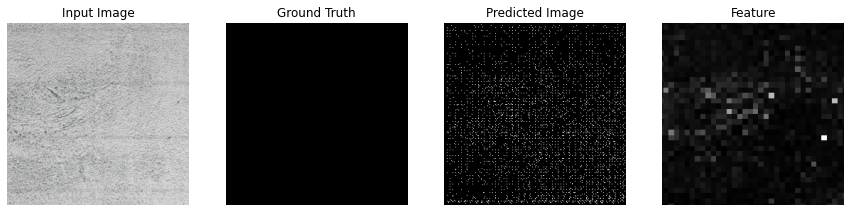

In [129]:
for example_input, example_target, example_feature in test_dataset.take(1):
    generate_images(generator, example_input, example_target, example_feature)

# Training the GAN

In [130]:
EPOCHS = 10

In [131]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [132]:
@tf.function
def train_step(input_image, target, feature, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator([input_image,feature], training=True)

        disc_real_output = discriminator([input_image, target, feature], training=True)
        disc_generated_output = discriminator([input_image, gen_output, feature], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [133]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target, example_feature in test_ds.take(1):
      generate_images(generator, example_input, example_target, example_feature)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target,feature) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, feature, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    #if (epoch + 1) % 20 == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

In [134]:
#docs_infra: no_execute
%load_ext tensorboard
#%tensorboard --logdir {log_dir}
%tensorboard --logdir logs/scalars

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 382), started 1:00:19 ago. (Use '!kill 382' to kill it.)

<IPython.core.display.Javascript object>

# Restoring Checkpoint and Actual Training

In [135]:
latest = tf.train.latest_checkpoint(checkpoint_dir)
print(latest)

./gdrive/MyDrive/CrackGAN/Checkpoints-Features-Atten2/ckpt-22


In [136]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

# Test and Train predictions

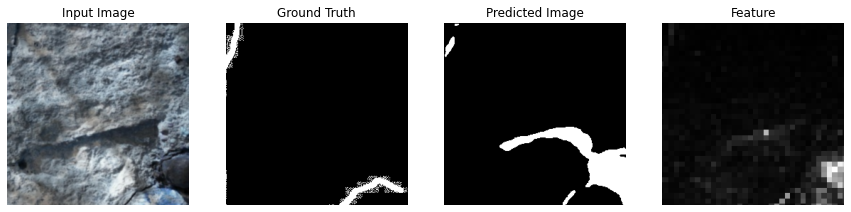

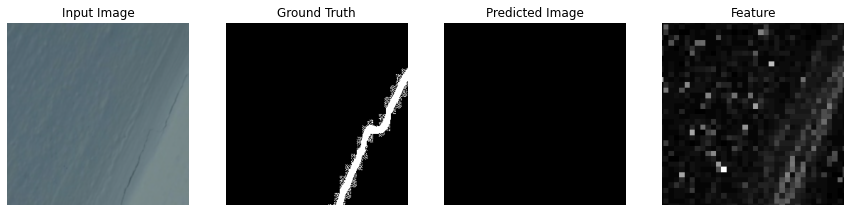

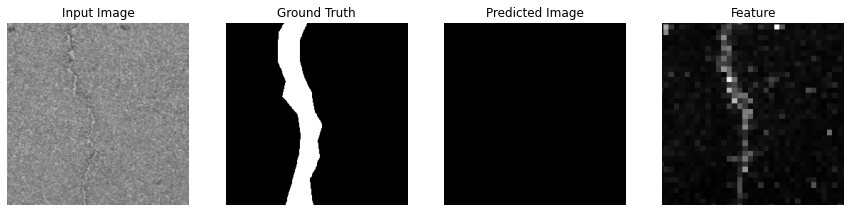

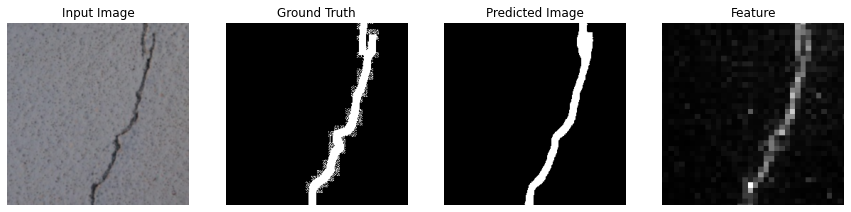

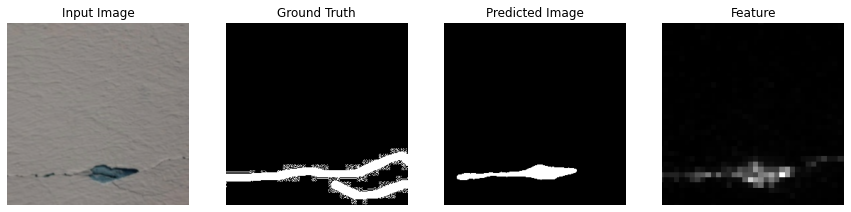

...

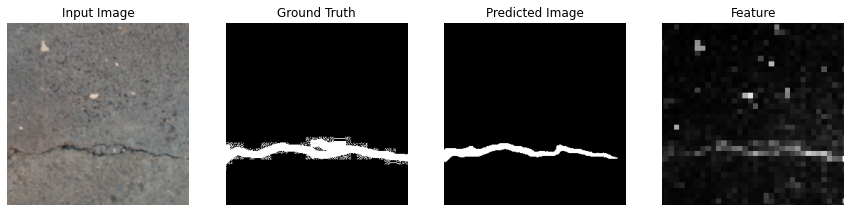

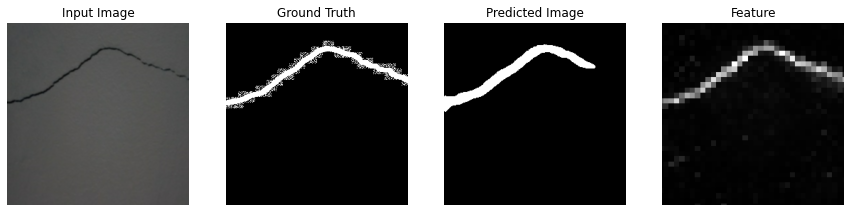

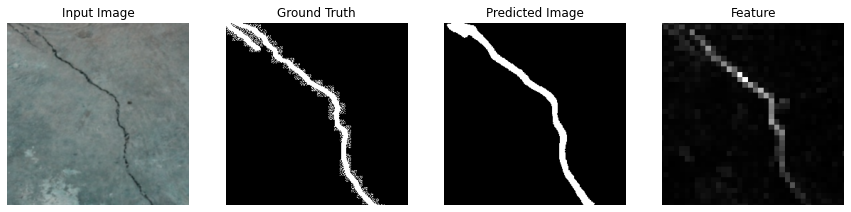

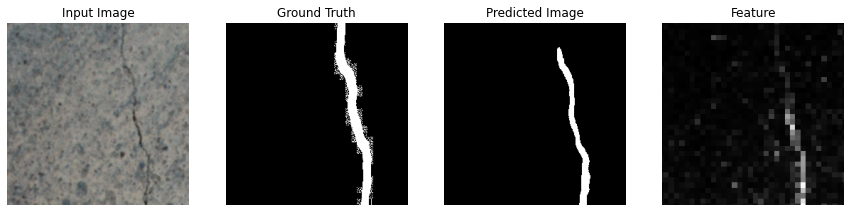

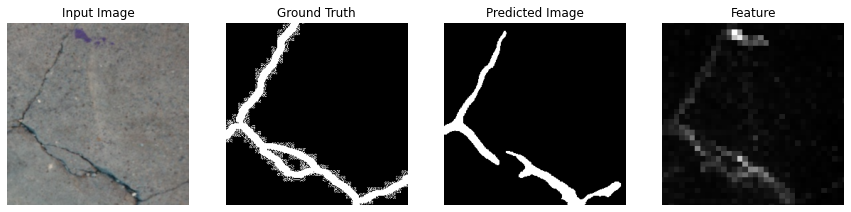

In [137]:
for example_input, example_target, example_feature in train_dataset.take(20):
    generate_images(generator, example_input, example_target, example_feature)

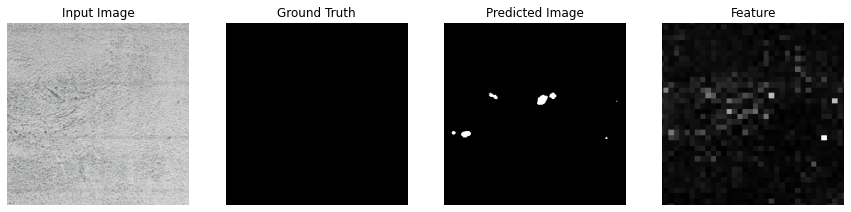

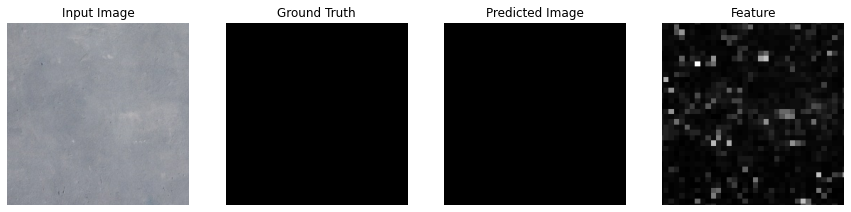

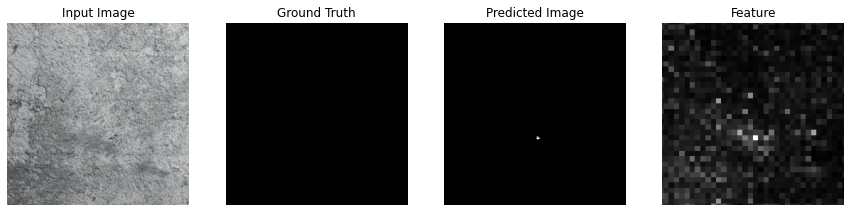

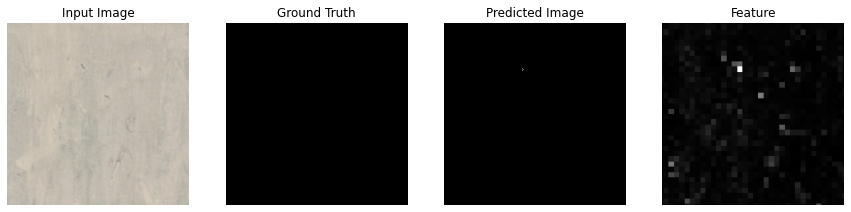

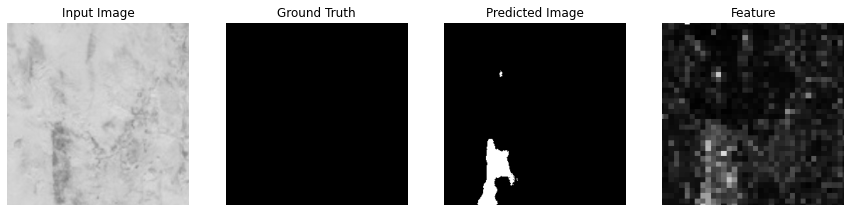

...

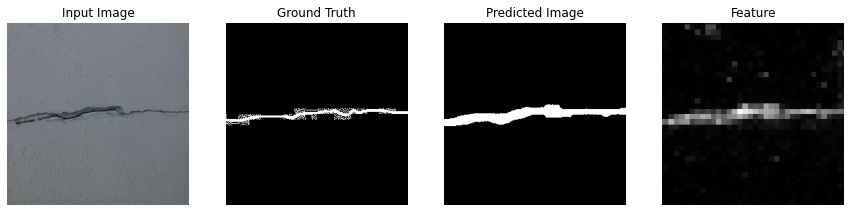

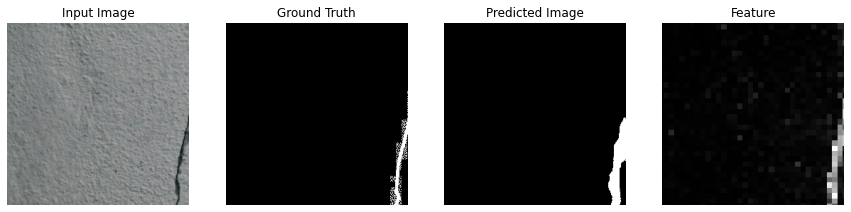

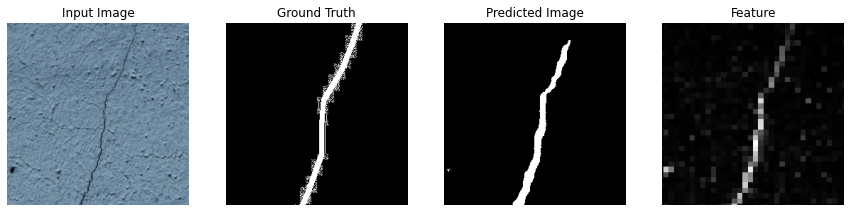

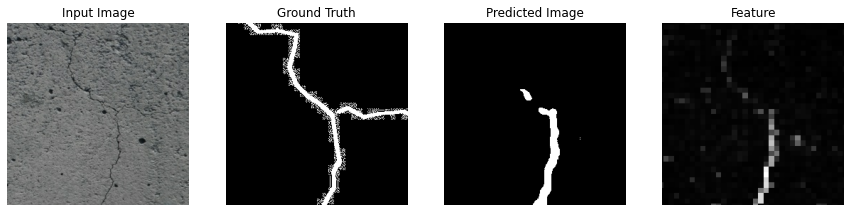

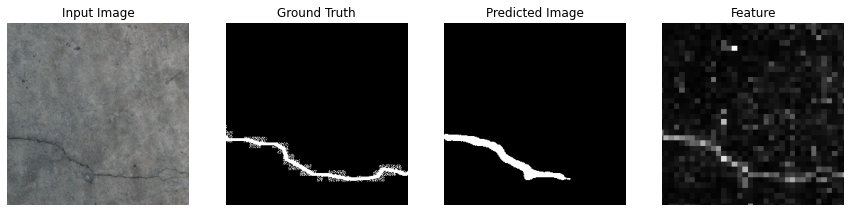

In [138]:
for example_input, example_target, example_feature in test_dataset.take(20):
    generate_images(generator, example_input, example_target, example_feature)

In [ ]:
for example_input, example_target, example_feature in train_dataset.take(5):
    generate_images(generator, example_input, example_target, example_feature)

# Metric Calculation

In [139]:
from sklearn.metrics import jaccard_score
import cv2

In [140]:
thresholds = np.linspace(0, 1, 10, endpoint=False)
thresholds = np.ndarray.tolist(thresholds)
thresholds = [round(num, 1) for num in thresholds]

In [141]:
def ods(target,predict):
  f1_list = []
  f1 = 0
  
  for l in thresholds:    
          actual = target.copy() 
          predicted = predict.copy()
          #axs[0].imshow(actual,cmap='gray')
          #axs[1].imshow(predicted,cmap='gray')

          actual[actual>l] = 1
          actual[actual<=l] = 0


          predicted[predicted>l] = 1
          predicted[predicted<=l] = 0

          p = tf.keras.metrics.MeanIoU(num_classes=2)
          p.update_state(actual.flatten(), predicted.flatten())
          f1_list.append(p.result().numpy())
          #f1 += averagef1(actual.flatten(),predicted.flatten())

          p.reset_state()
  ODS = max(f1_list)
  return ODS

In [142]:
a = list(test_dataset.as_numpy_iterator())

In [143]:
count = 0
ious = []
odsscores = []
checker = []
jaccard = []


for inp, tar, feat in a:
  prediction = generator([inp, feat], training=True)
  n = len(tar)


  for p in range(0,n):
    jaccard_flag = 0
    
    plot_tar = np.reshape(tar[p],(256,256)).copy()
    plot_pred = np.reshape(prediction[p],(256,256)).copy()
    plot_feat = np.reshape(feat[p],(256,256)).copy()
    # f,axs = plt.subplots(nrows=1,ncols=4,figsize=(15,70))

    
    # # for i in range(0,256):
    # #   for j in range(0,256):
    # #     if plot_pred[i][j]>=0.5:
    # #       plot_pred[i][j] = 1
    # #     else:
    # #       plot_pred[i][j] = 0

    # axs[0].imshow(inp[0],cmap = 'gray')
    # axs[1].imshow(plot_tar,cmap = 'gray')
    # axs[2].imshow(plot_pred,cmap = 'gray')
    # axs[3].imshow(plot_feat,cmap = 'gray')
    # break

    ods_score = ods(plot_tar,plot_pred)
    odsscores.append(ods_score)

    for i in range(0,256):
      for j in range(0,256):
        if plot_pred[i][j]>=0.5:
          plot_pred[i][j] = 1
        else:
          plot_pred[i][j] = 0

    for i in range(0,256):
      for j in range(0,256):
        if plot_tar[i][j]>=0.5:
          plot_tar[i][j] = 1
        else:
          plot_tar[i][j] = 0
    
    plot_pred2 = plot_pred.flatten()
    plot_tar2 = plot_tar.flatten()

    if (plot_tar2==1).sum() != 0 and (plot_pred2==1).sum() != 0:
      jaccard.append(jaccard_score(plot_tar2,plot_pred2))
      jaccard_flag = 1

    m = tf.keras.metrics.MeanIoU(num_classes=2)
    m.update_state(plot_tar2, plot_pred2)
    ious.append(m.result().numpy())
    
    if count%80 == 0:
      if jaccard_flag == 1:
        checker.append([inp,plot_tar,plot_pred,ods_score,m.result().numpy(),jaccard_score(plot_tar2,plot_pred2)])
      else:
        checker.append([inp,plot_tar,plot_pred,ods_score,m.result().numpy(),-1])
    count = count+1

    m.reset_state()


In [144]:
np.mean(jaccard)

0.3199587653820453

In [145]:
np.mean(odsscores)

0.6794239

In [146]:
np.mean(ious)

0.6501033

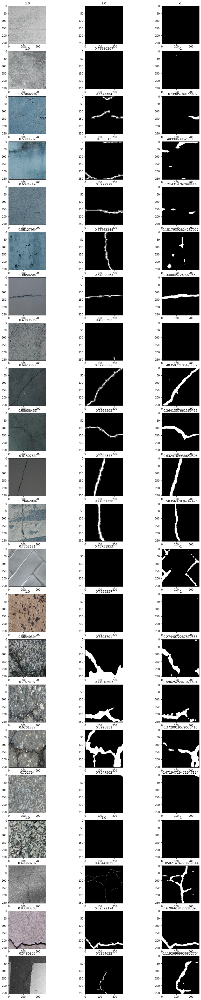

In [ ]:
f,axs = plt.subplots(nrows=len(checker),ncols=3,figsize=(15,70))
count = 0
for i in range(0,len(checker)):
  p = checker[i]
  input = p[0]
  target = p[1]
  prediction = p[2]
  odstemp = p[3]
  miou = p[4]
  jac = p[5]
  axs[i][0].imshow(input[count%32],cmap='gray')
  axs[i][1].imshow(target,cmap='gray')
  axs[i][2].imshow(prediction,cmap='gray')
  axs[i][0].set_title(odstemp)
  axs[i][1].set_title(miou)
  axs[i][2].set_title(jac)
  count = count+80

# Gen Testing

In [ ]:
ious2 = []


for inp, tar, feat in a:
  prediction = generator([inp, feat], training=True)
  n = len(tar)


  for p in range(0,n):
    jaccard_flag = 0
    
    plot_tar = np.reshape(tar[p],(256,256)).copy()
    plot_pred = np.reshape(prediction[p],(256,256)).copy()
    plot_feat = np.reshape(feat[p],(256,256)).copy()

    for i in range(0,256):
      for j in range(0,256):
        if plot_pred[i][j]>=0.95:
          plot_pred[i][j] = 1
        else:
          plot_pred[i][j] = 0

    for i in range(0,256):
      for j in range(0,256):
        if plot_tar[i][j]>=0.95:
          plot_tar[i][j] = 1
        else:
          plot_tar[i][j] = 0
    
    plot_pred2 = plot_pred.flatten()
    plot_tar2 = plot_tar.flatten()

    # if (plot_tar2==1).sum() != 0 and (plot_pred2==1).sum() != 0:
    #   jaccard.append(jaccard_score(plot_tar2,plot_pred2))
    #   jaccard_flag = 1

    m = tf.keras.metrics.MeanIoU(num_classes=2)
    m.update_state(plot_tar2, plot_pred2)
    ious2.append(m.result().numpy())
    
    # if count%80 == 0:
    #   if jaccard_flag == 1:
    #     checker.append([inp,plot_tar,plot_pred,ods_score,m.result().numpy(),jaccard_score(plot_tar2,plot_pred2)])
    #   else:
    #     checker.append([inp,plot_tar,plot_pred,ods_score,m.result().numpy(),-1])
    # count = count+1

    m.reset_state()

In [ ]:
np.mean(ious2)

0.65735143